In [1]:
import cv2
import mmcv
import numpy as np
import torch
from mmcv.transforms import Compose
from mmdet.apis import init_detector
from mmengine import Config
from mmengine.registry import TRANSFORMS
from mmengine.structures import InstanceData
from mmrotate.structures import RotatedBoxes
from mmrotate.utils import register_all_modules
from mmrotate.visualization import RotLocalVisualizer
from segment_anything import SamPredictor, sam_model_registry

/opt/conda/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def mask2rbox(mask):
    y, x = np.nonzero(mask)
    points = np.stack([x, y], axis=-1)
    (cx, cy), (w, h), a = cv2.minAreaRect(points)
    r_bbox = np.array([cx, cy, w, h, a / 180 * np.pi])
    return r_bbox


def get_instancedata_resultlist(r_bboxes,
                                labels,
                                masks,
                                scores,
                                result_with_mask=False):
    results = InstanceData()
    results.bboxes = RotatedBoxes(r_bboxes)
    results.scores = scores
    results.labels = labels
    if result_with_mask:
        results.masks = masks.cpu().numpy()
    results_list = [results]
    return results_list

In [3]:
#%mkdir ../mmrotate && git clone https://github.com/open-mmlab/mmrotate.git ../mmrotate

In [4]:
#%mkdir ../sam-mmrotate && git clone https://github.com/Li-Qingyun/sam-mmrotate.git ../sam-mmrotate

In [5]:
#%ls ../mmrotate/configs/rotated_fcos

In [3]:
register_all_modules(init_default_scope=True)


device='cuda:0'
config_file = '../sam-mmrotate/configs/rotated_fcos/rotated-fcos-hbox-le90_r50_fpn_1x_dota.py'
detector_cfg = Config.fromfile(config_file)
checkpoint_file = 'models/rotated_fcos_sep_angle_r50_fpn_1x_dota_le90-0be71a0c.pth'
#sam_weigth='models/sam_vit_h_4b8939.pth'
sam_weigth='models/sam_vit_b_01ec64.pth'


if 'init_cfg' in detector_cfg.model.backbone:
    detector_cfg.model.backbone.init_cfg = None

det_model = init_detector(
    detector_cfg, checkpoint_file, device=device, cfg_options={})


#det_model = det_model.to(device)

Loads checkpoint by local backend from path: models/rotated_fcos_sep_angle_r50_fpn_1x_dota_le90-0be71a0c.pth


In [4]:
build_sam = sam_model_registry['vit_b']
sam_model = SamPredictor(build_sam(checkpoint=sam_weigth))
sam_model.model = sam_model.model.to(device)

In [5]:
def inference(img_path = "images/cloud_2_5_2020_825.jpg", out_path = "images/out_cloud.jpg"):
    naive_test_pipeline = [
            dict(type='mmdet.LoadImageFromFile'),
            dict(type='mmdet.Resize', scale=(1024, 1024), keep_ratio=True),
            dict(
                type='mmdet.PackDetInputs',
                meta_keys=('img_path', 'ori_shape', 'img_shape', 'scale_factor'))
        ]
    tfm = Compose([TRANSFORMS.build(p) for p in naive_test_pipeline])
    data = tfm(dict(img_path=img_path))
    for k, v in data.items():
        data[k] = [v.to(device)]

    # predict with detector
    pred_results = det_model.test_step(data)
    pred_bboxes = pred_results[0].pred_instances.bboxes
    # If horizontal detector is used, directly use the predicted HBB as
    # prompts. If oriented detector is used, the OBB is converted to HBB.
    if pred_bboxes.size(-1) == 5:
        pred_r_bboxes = RotatedBoxes(pred_bboxes)
        h_bboxes = pred_r_bboxes.convert_to('hbox').tensor
    elif pred_bboxes.size(-1) == 4:
        h_bboxes = pred_bboxes
    else:
        raise ValueError(f'The dimension of box is {pred_bboxes.size(-1)}.')
    labels = pred_results[0].pred_instances.labels
    scores = pred_results[0].pred_instances.scores
    keep = scores > 0.1
    h_bboxes = h_bboxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    # prompt sam with predicted boxes
    img = mmcv.imread(img_path, channel_order='RGB')
    sam_model.set_image(img, image_format='RGB')
    # Too many predictions may result in OOM, hence,
    # we process the predictions in multiple batches.
    masks = []
    N = 8
    num_pred = len(h_bboxes)
    num_batches = int(np.ceil(num_pred / N))
    for i in range(num_batches):
        left_index = i * N
        right_index = (i + 1) * N
        if i == num_batches - 1:
            batch_boxes = h_bboxes[left_index:]
        else:
            batch_boxes = h_bboxes[left_index:right_index]

        transformed_boxes = sam_model.transform.apply_boxes_torch(
            batch_boxes, img.shape[:2])
        batch_masks = sam_model.predict_torch(
            point_coords=None,
            point_labels=None,
            boxes=transformed_boxes,
            multimask_output=False)[0]
        batch_masks = batch_masks.squeeze(1).cpu()
        masks.extend([*batch_masks])
    masks = torch.stack(masks, dim=0)
    r_bboxes = [mask2rbox(mask.numpy()) for mask in masks]

    results_list = get_instancedata_resultlist(r_bboxes, labels, masks, scores,
                                               True)

    # initialize visualizer
    visualizer = RotLocalVisualizer(
        vis_backends=[dict(type='LocalVisBackend')], name='MMRotate-SAM')
    out_img = visualizer._draw_instances(img, results_list[0],
                                         det_model.dataset_meta['classes'],
                                         det_model.dataset_meta['palette'])
    #mmcv.imwrite(out_img, out_path)
    return out_img

In [18]:
%%time
im = inference()

CPU times: user 1.31 s, sys: 231 ms, total: 1.55 s
Wall time: 1.3 s


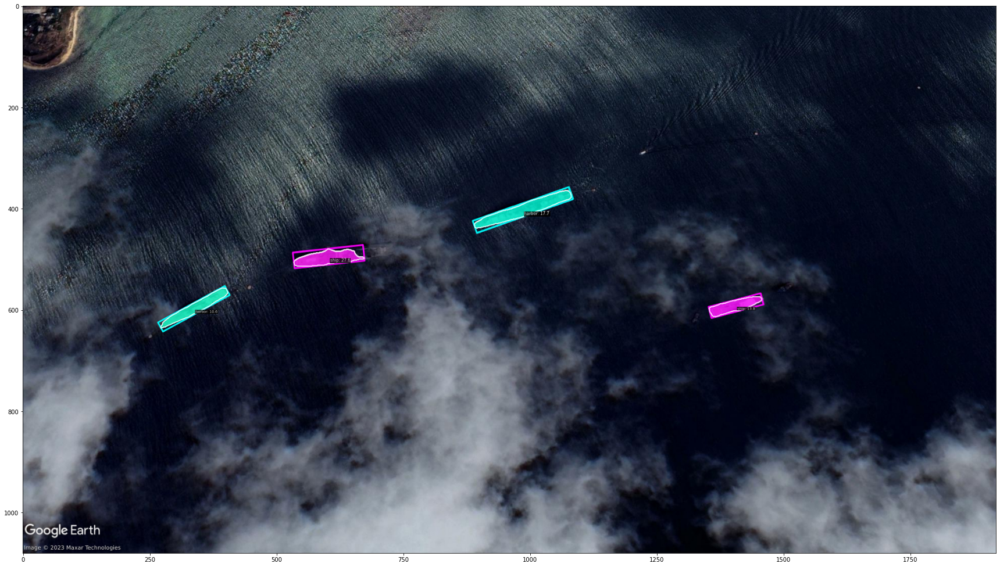

In [19]:
import matplotlib.pyplot as plt
im.shape
plt.figure(figsize=(30,30))
im = cv2.cvtColor(im, cv2.COLOR_RGB2BGR)
plt.imshow(im)
plt.show()

In [20]:
%%time
im = inference(img_path="images/mosaic_RGB.tiff")

CPU times: user 1.89 s, sys: 502 ms, total: 2.4 s
Wall time: 1.97 s


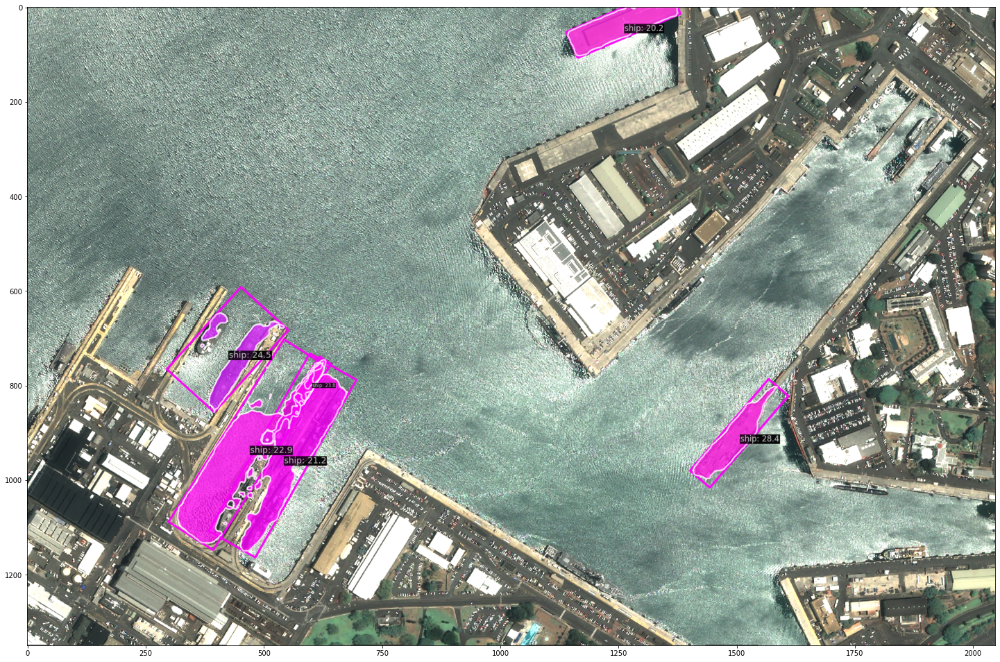

In [4]:
import cv2
import matplotlib.pyplot as plt
im_path = 'images/out.png'
im = cv2.imread(im_path)
plt.figure(figsize=(25,25))
im = cv2.cvtColor(im, cv2.COLOR_RGB2BGR)
plt.imshow(im)
plt.show()

In [9]:
%%time
im = inference(img_path="images/ice_2_2019_1250.jpg")

/opt/conda/lib/python3.7/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


CPU times: user 1.49 s, sys: 316 ms, total: 1.81 s
Wall time: 1.51 s


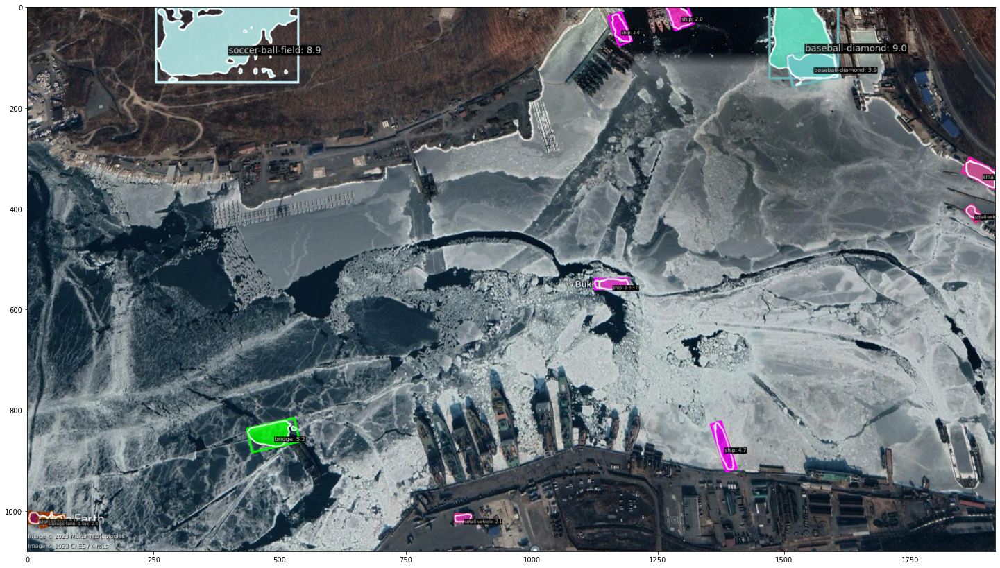

In [5]:
im_path = 'images/out_ice.png'
im = cv2.imread(im_path)
plt.figure(figsize=(25,25))
im = cv2.cvtColor(im, cv2.COLOR_RGB2BGR)
plt.imshow(im)
plt.show()

In [23]:
%%time
im = inference(img_path="images/cambio_mar_1.png")

CPU times: user 1.43 s, sys: 382 ms, total: 1.82 s
Wall time: 1.45 s


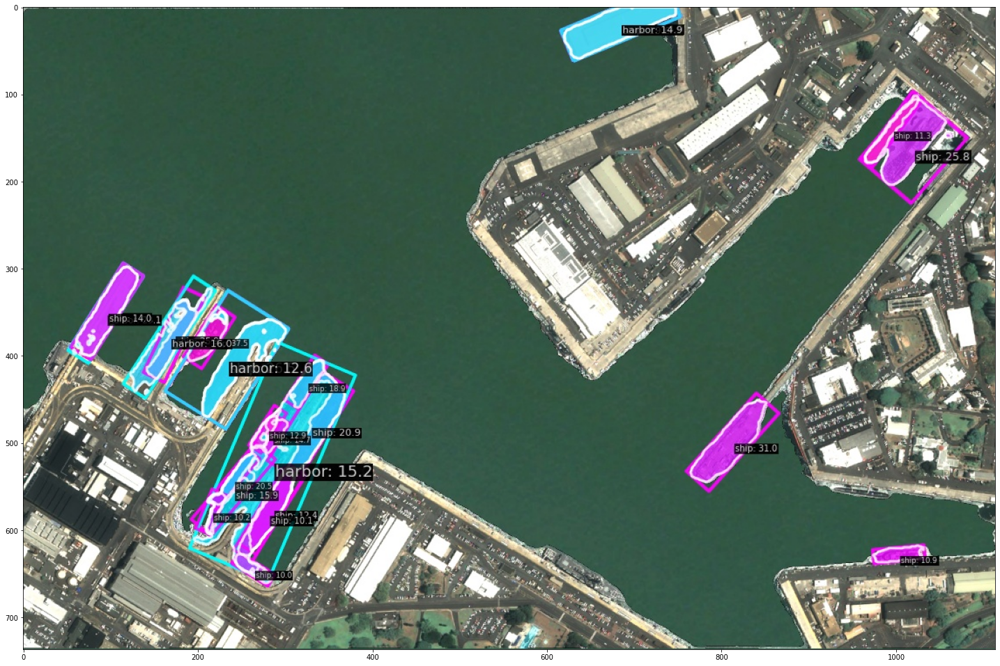

In [8]:
im_path = 'images/out_cambio_mar.jpg'
im = cv2.imread(im_path)
plt.figure(figsize=(25,25))
im = cv2.cvtColor(im, cv2.COLOR_RGB2BGR)
plt.imshow(im)
plt.show()